In [1]:
import pymysql
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from time import time
from collections import Counter
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, OneHotEncoder
from pandas_profiling import ProfileReport
from IPython.display import Image
from sklearn.model_selection import train_test_split, RandomizedSearchCV, KFold, cross_val_score
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier, VotingClassifier, RandomForestRegressor, AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier, StackingClassifier
from sklearn.tree import export_graphviz
import pydotplus
from sklearn import tree
from sklearn.externals.six import StringIO
import graphviz
import matplotlib.image as mpimg
from imblearn.over_sampling import SMOTE


import warnings
warnings.simplefilter('ignore')

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\externals\six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


In [2]:
rand_state = 10
n_iterations = 5

In [3]:
db_host='54.255.64.49'
username='dm_team3'
user_pass='DM!$!Team!27@9!20&'
db_name='project_telecom'

In [4]:
conn = pymysql.connect(host=db_host,port=int(3306),user=username,passwd=user_pass,db=db_name)

In [5]:
telecom_churn_data=pd.read_sql_query("SELECT * FROM telecom_churn_data ",conn)
telecom_churn_data.head()

,columns1,columns2,columns3,columns4,columns5,columns6,columns7,columns8,columns9,columns10,...,columns12,columns13,columns14,columns15,columns16,columns17,columns18,columns19,columns20,columns21
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10,3,2.7,1,False.
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.7,1,False.
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.3,162.6,104,7.32,12.2,5,3.29,0,False.
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.9,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False.
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False.


In [6]:
telecom_churn_data.columns = ['State', 'Account_Length', 'Area_Code','Phone', 'Int_Plan', 'VMail', 'VMailMsg', 'DayMins', 'DayCalls', 'DayCharge', 'EveMins', 'EveCalls', 'EveCharge', 'NightMins', 'NightCalls', 'NightCharge', 'IntMins', 'IntCalls', 'IntCharge', 'CustServCalls', 'Churn']

In [7]:
telecom_churn_data.shape

(4617, 21)

In [8]:
telecom_churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   State           4617 non-null   object
 1   Account_Length  4617 non-null   object
 2   Area_Code       4617 non-null   object
 3   Phone           4617 non-null   object
 4   Int_Plan        4617 non-null   object
 5   VMail           4617 non-null   object
 6   VMailMsg        4617 non-null   object
 7   DayMins         4617 non-null   object
 8   DayCalls        4617 non-null   object
 9   DayCharge       4617 non-null   object
 10  EveMins         4617 non-null   object
 11  EveCalls        4617 non-null   object
 12  EveCharge       4617 non-null   object
 13  NightMins       4617 non-null   object
 14  NightCalls      4617 non-null   object
 15  NightCharge     4617 non-null   object
 16  IntMins         4617 non-null   object
 17  IntCalls        4617 non-null   object
 18  IntCharg

In [9]:
telecom_churn_data.isnull().sum()

State             0
Account_Length    0
Area_Code         0
Phone             0
Int_Plan          0
VMail             0
VMailMsg          0
DayMins           0
DayCalls          0
DayCharge         0
EveMins           0
EveCalls          0
EveCharge         0
NightMins         0
NightCalls        0
NightCharge       0
IntMins           0
IntCalls          0
IntCharge         0
CustServCalls     0
Churn             0
dtype: int64

In [10]:
telecom_churn_data.nunique(dropna=False)

State               51
Account_Length     218
Area_Code            3
Phone             4617
Int_Plan             2
VMail                2
VMailMsg            47
DayMins           1901
DayCalls           123
DayCharge         1901
EveMins           1833
EveCalls           125
EveCharge         1621
NightMins         1813
NightCalls         130
NightCharge       1012
IntMins            168
IntCalls            21
IntCharge          168
CustServCalls       10
Churn                2
dtype: int64

In [11]:
telecom_churn_data.drop(columns='Phone', inplace=True)

In [12]:
Catvar_list=['State', 'Area_Code', 'Int_Plan', 'VMail', 'IntCalls', 'CustServCalls', 'Churn']

In [13]:
telecom_churn_data[Catvar_list]

,State,Area_Code,Int_Plan,VMail,IntCalls,CustServCalls,Churn
0,KS,415,no,yes,3,1,False.
1,OH,415,no,yes,3,1,False.
2,NJ,415,no,no,5,0,False.
3,OH,408,yes,no,7,2,False.
4,OK,415,yes,no,3,3,False.
...,...,...,...,...,...,...,...
4612,NY,510,no,yes,6,3,False.
4613,NM,408,no,yes,1,3,False.
4614,VT,408,no,yes,3,1,False.
4615,MI,415,no,yes,3,0,False.


In [14]:
for cat in Catvar_list:
    print('\nUnique values of Project_Data.'+cat+':: \n',telecom_churn_data[cat].value_counts(dropna = False))


Unique values of Project_Data.State:: 
 WV    149
AL    114
MN    112
ID    110
OH    110
NY    109
VA    109
OR    107
WY    106
NJ    106
TX    105
UT    104
WI     99
MI     98
MA     97
KS     96
ME     95
VT     95
CT     92
MT     92
MD     92
MS     91
CO     91
NH     91
RI     90
KY     90
IN     89
WA     89
DE     89
NV     89
FL     85
MO     84
NM     84
NC     83
SC     83
TN     83
DC     82
AZ     81
OK     80
ND     80
IL     79
NE     79
HI     79
GA     77
AR     77
SD     76
LA     73
AK     69
PA     68
IA     65
CA     44
Name: State, dtype: int64

Unique values of Project_Data.Area_Code:: 
 415    2299
408    1161
510    1157
Name: Area_Code, dtype: int64

Unique values of Project_Data.Int_Plan:: 
  no     4171
 yes     446
Name: Int_Plan, dtype: int64

Unique values of Project_Data.VMail:: 
  no     3381
 yes    1236
Name: VMail, dtype: int64

Unique values of Project_Data.IntCalls:: 
 3     925
4     881
2     680
5     646
6     460
7     283
1     245
8     

In [15]:
ProfileReport(telecom_churn_data)

In [16]:
Catvar_list_enc=['State', 'Area_Code', 'Int_Plan', 'VMail', 'Churn']

In [17]:
labelencoder = LabelEncoder()

In [18]:
telecom_churn_data_enc = telecom_churn_data

In [19]:
Feature_Code_Value = pd.DataFrame(columns=['Feature_Type', 'Feature_Value', 'Feature_Value_Enc', 'Feature_Value_Cnt'])

In [20]:
for feat in Catvar_list_enc:
    feat_col_name = feat+'_enc'
    telecom_churn_data_enc[feat_col_name] = labelencoder.fit_transform(telecom_churn_data_enc[feat].astype(str))
    feat_temp_val = telecom_churn_data_enc.groupby([feat, feat_col_name]).size().reset_index().rename(columns={0:'Feature_Value_Cnt'})
    feat_temp_val['Feature_Type'] = feat
    #feat_temp_val[['Feature_Type', feat, feat_col_name, 'Feature_Value_Cnt']]
    Feature_Code_Value = Feature_Code_Value[['Feature_Type', 'Feature_Value', 'Feature_Value_Enc', 'Feature_Value_Cnt']].append(feat_temp_val[['Feature_Type', feat, feat_col_name, 'Feature_Value_Cnt']])
    Feature_Code_Value.Feature_Value.fillna(Feature_Code_Value[feat], inplace=True)
    Feature_Code_Value.Feature_Value_Enc.fillna(Feature_Code_Value[feat_col_name], inplace=True)
    Feature_Code_Value.drop(columns=[feat, feat_col_name], axis=1, inplace=True)
    del feat_temp_val
    telecom_churn_data_enc.drop(columns=[feat], axis=1, inplace=True)
    
Feature_Code_Value.reset_index(drop=True, inplace=True)
Feature_Code_Value['Feature_Value_Enc'] = Feature_Code_Value['Feature_Value_Enc'].astype(int)

In [21]:
Feature_Code_Value

,Feature_Type,Feature_Value,Feature_Value_Enc,Feature_Value_Cnt
0,State,AK,0,69
1,State,AL,1,114
2,State,AR,2,77
3,State,AZ,3,81
4,State,CA,4,44
5,State,CO,5,91
6,State,CT,6,92
7,State,DC,7,82
8,State,DE,8,89
9,State,FL,9,85


In [22]:
Catvar_list=['State_enc', 'Area_Code_enc', 'Int_Plan_enc', 'VMail_enc', 'IntCalls', 'CustServCalls', 'Churn_enc']

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000025A8DA96B70>,
      dtype=object)

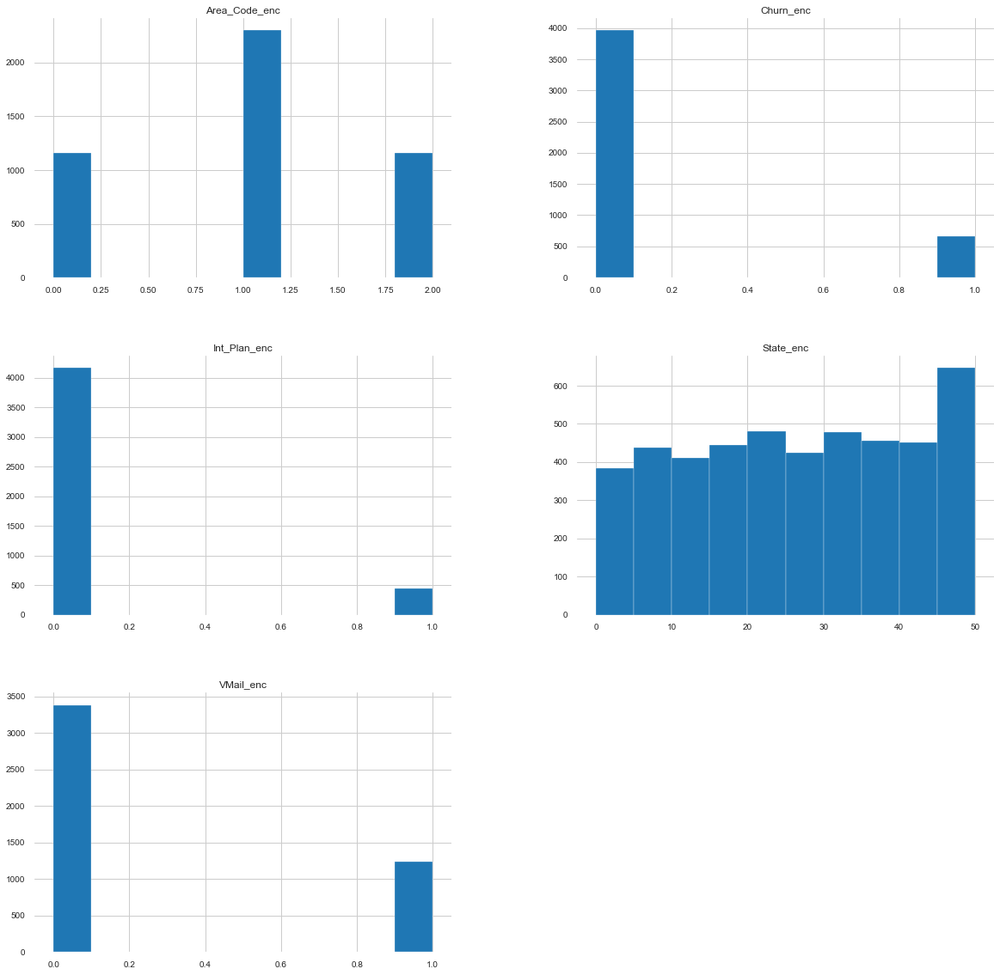

In [23]:
telecom_churn_data_enc[Catvar_list].hist(figsize=(20,20))

In [24]:
Convar_list=['Account_Length','VMailMsg','DayMins','DayCalls','DayCharge','EveMins','EveCalls','EveCharge','NightMins',
            'NightCalls','NightCharge','IntMins','IntCharge']

In [25]:
for i in Convar_list:
    telecom_churn_data_enc[i]=telecom_churn_data_enc[i].astype('float').astype(int)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000025A8DDC4C88>,
      dtype=object)

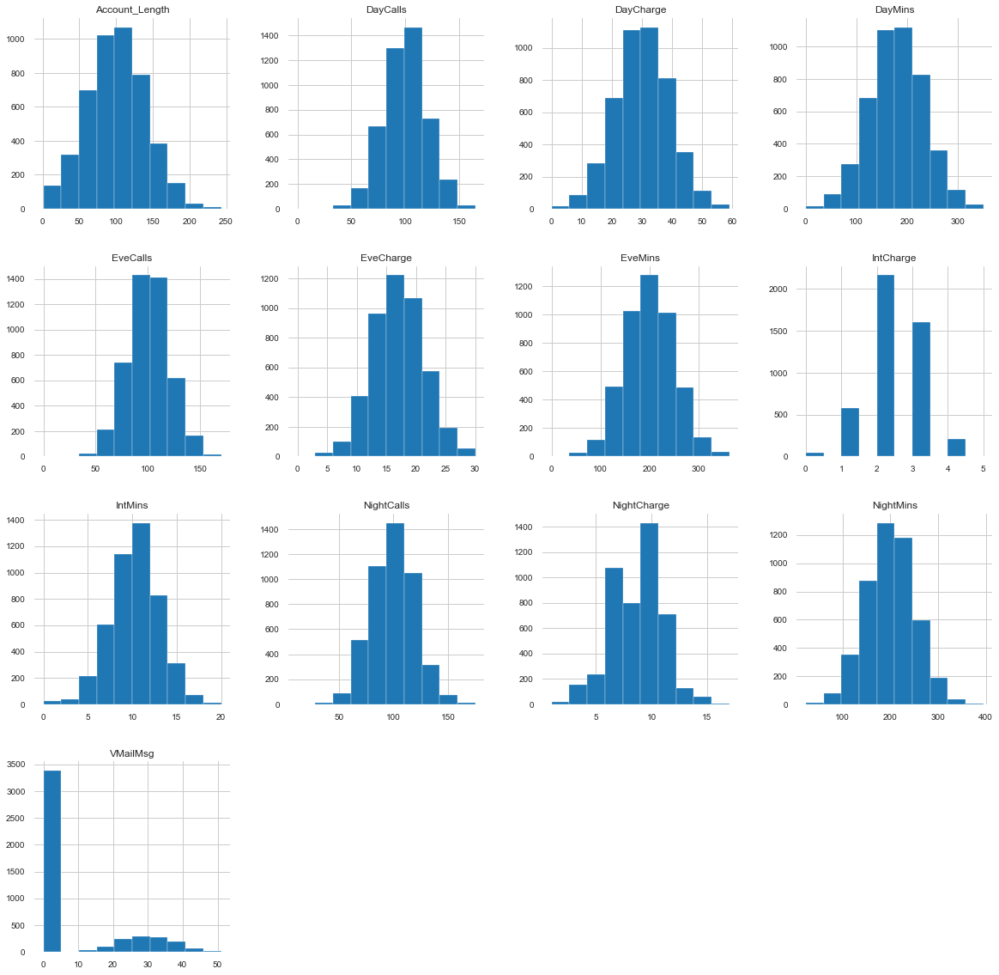

In [26]:
telecom_churn_data_enc[Convar_list].hist(figsize=(20,20))

In [27]:
X_DT = telecom_churn_data_enc.drop(columns=['Churn_enc'], axis=1)
y_DT = telecom_churn_data_enc.Churn_enc

In [28]:
X_train_DT, X_test_DT, y_train_DT, y_test_DT = train_test_split(X_DT, y_DT, test_size=0.25, random_state=10)

In [29]:
XGBoostError = ""
LightGBMError = ""
ValueError = ""
def plot_feature_importances(clf, X_train, y_train=None, 
                             top_n=10, figsize=(8,8), print_table=False, title="Feature Importances"):
    '''
    plot feature importances of a tree-based sklearn estimator
    
    Note: X_train and y_train are pandas DataFrames
    
    Note: Scikit-plot is a lovely package but I sometimes have issues
              1. flexibility/extendibility
              2. complicated models/datasets
          But for many situations Scikit-plot is the way to go
          see https://scikit-plot.readthedocs.io/en/latest/Quickstart.html
    
    Parameters
    ----------
        clf         (sklearn estimator) if not fitted, this routine will fit it
        
        X_train     (pandas DataFrame)
        
        y_train     (pandas DataFrame)  optional
                                        required only if clf has not already been fitted 
        
        top_n       (int)               Plot the top_n most-important features
                                        Default: 10
                                        
        figsize     ((int,int))         The physical size of the plot
                                        Default: (8,8)
        
        print_table (boolean)           If True, print out the table of feature importances
                                        Default: False
        
    Returns
    -------
        the pandas dataframe with the features and their importance
        
    Author
    ------
        George Fisher
    '''
    
    __name__ = "plot_feature_importances"
    
    
    try: 
        if not hasattr(clf, 'feature_importances_'):
            clf.fit(X_train.values, y_train.values.ravel())

            if not hasattr(clf, 'feature_importances_'):
                raise AttributeError("{} does not have feature_importances_ attribute".
                                    format(clf.__class__.__name__))
                
    #except (XGBoostError, LightGBMError, ValueError):
    except:
        clf.fit(X_train.values, y_train.values.ravel())
            
    feat_imp = pd.DataFrame({'importance':clf.feature_importances_})    
    feat_imp['feature'] = X_train.columns
    feat_imp.sort_values(by='importance', ascending=False, inplace=True)
    feat_imp = feat_imp.iloc[:top_n]
    plt.rcParams.update({'figure.autolayout': True})
    #plt.rcParams["axes.edgecolor"] = "0.15"
    #plt.rcParams["axes.linewidth"]  = 1.25
    #plt.grid()

    feat_imp.sort_values(by='importance', inplace=True)
    feat_imp = feat_imp.set_index('feature', drop=True)
    feat_imp.plot.barh(figsize=figsize)
    #plt.title("Feature Importances", fontsize = 15, fontweight="bold")
    plt.xlabel('Feature Importance Score', fontsize = 15)
    plt.ylabel('Features', fontsize = 15)
    plt.savefig('Feature_Importance_before_scaling_ohe.png')
    plt.show()
    
    if print_table:
        from IPython.display import display
        print("Top {} features in descending order of importance".format(top_n))
        display(feat_imp.sort_values(by='importance', ascending=False))
        
    return feat_imp

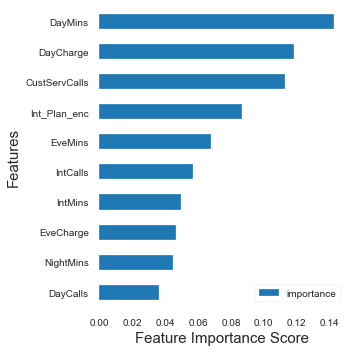

,importance
feature,
DayCalls,0.036414
NightMins,0.044916
EveCharge,0.046902
IntMins,0.049602
IntCalls,0.056969
EveMins,0.067793
Int_Plan_enc,0.086910
CustServCalls,0.112620
DayCharge,0.118560


In [30]:
plot_feature_importances(RandomForestClassifier(random_state=rand_state), X_train_DT, y_train_DT, top_n=10, figsize=(5,5))

In [31]:
clf = DecisionTreeClassifier(max_depth=4)
clf = clf.fit(X_train_DT,y_train_DT)
y_pred = clf.predict(X_test_DT)

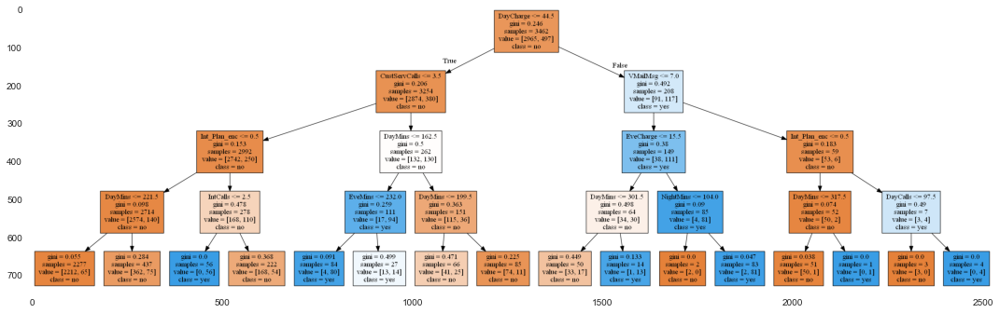

In [32]:
dot_data = tree.export_graphviz(clf, out_file=None, 
                                feature_names=X_train_DT.columns,  
                                class_names=['no', 'yes'],
                                filled=True)

# Draw graph
graph = graphviz.Source(dot_data, format="png") 
graph
graph.render("DT")

plt.figure(figsize=(15,15))

img = mpimg.imread('DT.png')
imgplot = plt.imshow(img)
plt.show()

In [33]:
scaler = MinMaxScaler()

In [34]:
telecom_churn_data_enc_scaled = pd.DataFrame(scaler.fit_transform(telecom_churn_data_enc), columns=telecom_churn_data_enc.columns)

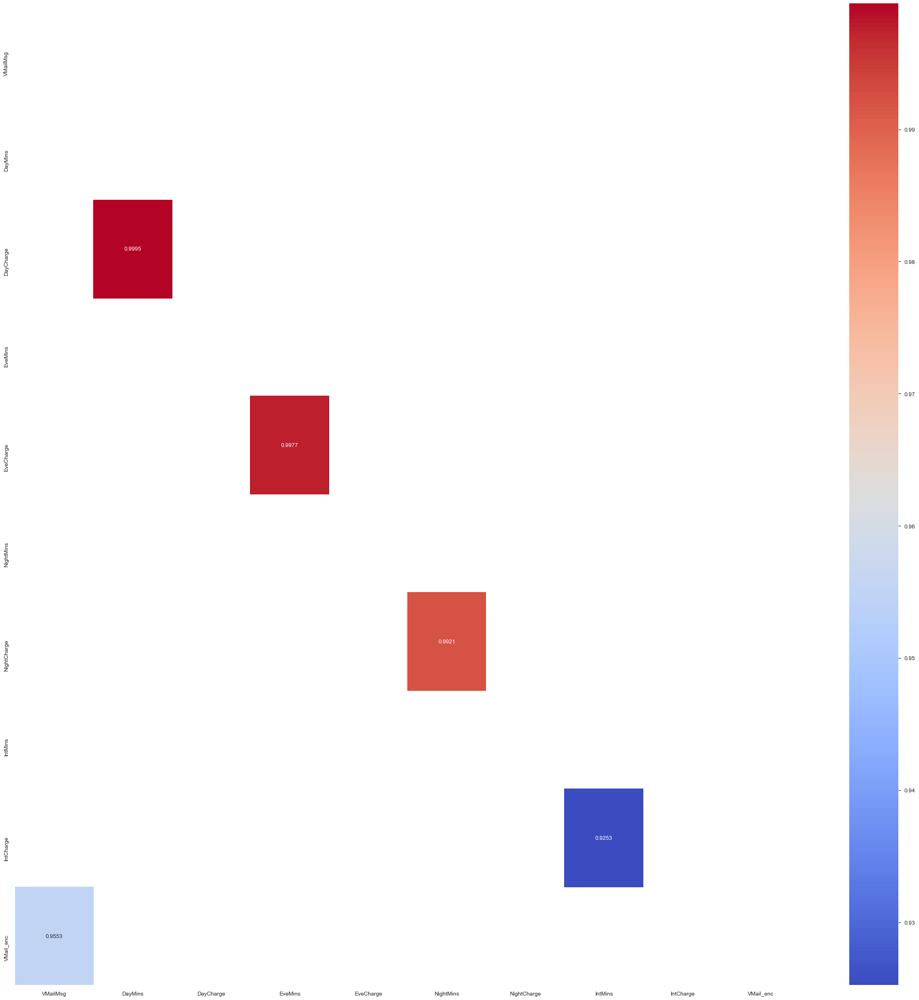

In [35]:
corr = telecom_churn_data_enc_scaled.corr()

kot = corr[(corr>=.8) & (corr<1)]
kot.dropna(axis=0, how='all', inplace = True)
kot.dropna(axis=1, how='all', inplace = True)
plt.figure(figsize=(25,25))
#sns.heatmap(kot, annot=True, fmt='.4g', cmap= 'coolwarm', linewidths=3, linecolor='black')

matrix = np.triu(kot)
sns.heatmap(kot, annot=True, fmt='.4g', cmap= 'coolwarm', mask = matrix)

In [36]:
kot

,VMailMsg,DayMins,DayCharge,EveMins,EveCharge,NightMins,NightCharge,IntMins,IntCharge,VMail_enc
VMailMsg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.95528
DayMins,NaN,NaN,0.999502,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DayCharge,NaN,0.999502,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EveMins,NaN,NaN,NaN,NaN,0.997663,NaN,NaN,NaN,NaN,NaN
EveCharge,NaN,NaN,NaN,0.997663,NaN,NaN,NaN,NaN,NaN,NaN
NightMins,NaN,NaN,NaN,NaN,NaN,NaN,0.992121,NaN,NaN,NaN
NightCharge,NaN,NaN,NaN,NaN,NaN,0.992121,NaN,NaN,NaN,NaN
IntMins,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.925258,NaN
IntCharge,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.925258,NaN,NaN
VMail_enc,0.95528,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [37]:
corr_matrix = telecom_churn_data_enc_scaled.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.8)]

to_drop

['DayCharge', 'EveCharge', 'NightCharge', 'IntCharge', 'VMail_enc']

In [38]:
telecom_churn_data_no_corr = telecom_churn_data_enc_scaled.drop(columns=to_drop, axis=1)

In [39]:
ProfileReport(telecom_churn_data_no_corr)

In [40]:
X = telecom_churn_data_no_corr.drop(columns=['Churn_enc'], axis=1)
y = telecom_churn_data_no_corr.Churn_enc

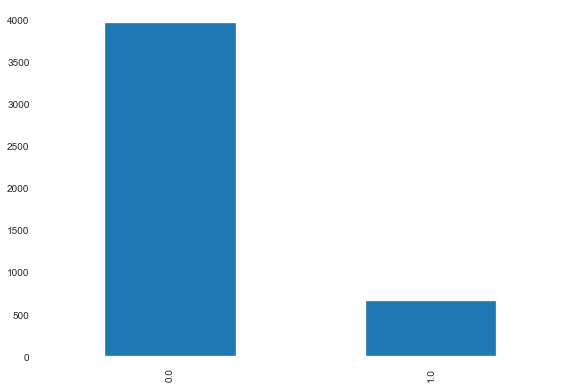

In [41]:
y.value_counts().plot(kind='bar')

In [42]:
smote = SMOTE()

In [43]:
X_smote, y_smote = smote.fit_sample(X.astype('float'), y)

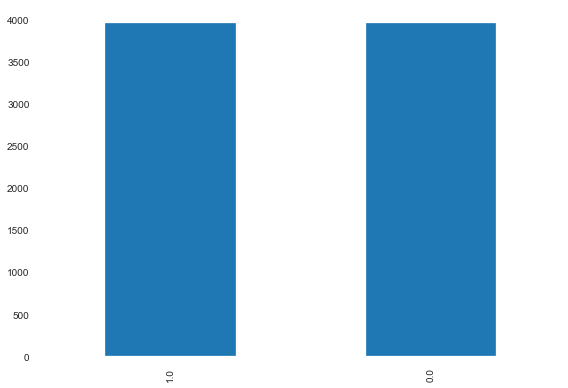

In [44]:
y_smote.value_counts().plot(kind='bar')

In [45]:
X_train, X_test, y_train, y_test = train_test_split(X_smote, y_smote, test_size=0.25, random_state=rand_state)

In [46]:
y_train.value_counts()

1.0    2976
0.0    2965
Name: Churn_enc, dtype: int64

In [47]:
y_test.value_counts()

0.0    996
1.0    985
Name: Churn_enc, dtype: int64